In [1]:
import fastai
from fastai.vision import *
path = Path('/home/ubuntu/WFP_Nepal_RGB-Scale3.5_PNG/')

In [2]:
images = ImageList.from_folder(path)

In [3]:
print(f'Processing {len(images)} images.')

Processing 1 images.


In [4]:
path_test= Path('test')
path_cropped_100 = Path('/home/ubuntu/NepalImages/cropped-100')

In [5]:
learn = load_learner(path_test)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'fastai.vision.models.unet.UnetBlock' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'fastai.layers.PixelShuffle_ICNR' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'fastai.layers.MergeLayer' has changed. you can retrieve the original source code by accessing the obje

In [84]:
def get_data(sz=500):
    #Give it some folder, as long as it exists, it can be empty
    data = (ImageImageList.from_folder('data').split_by_rand_pct(0.1, seed=42)
              .label_from_func(lambda x: x)
              .transform(get_transforms(), size=sz, tfm_y=True)
              .databunch(bs=1).normalize(imagenet_stats, do_y=True))
    data.c = 3
    return data
learn.data = get_data((1000,1000))

/home/ubuntu/anaconda3/lib/python3.6/site-packages/fastai/data_block.py:451: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/home/ubuntu/anaconda3/lib/python3.6/site-packages/fastai/data_block.py:454: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


In [87]:
def superres_1(inp):
    img = open_image(inp);    
    p,img_hr,b = learn.predict(img)
    return img_hr

In [63]:
import cv2
cv2.imwrite('output.png',cv2.cvtColor(image2np(hr.data*255), cv2.COLOR_RGB2BGR))

True

In [80]:
def blur_and_sr(path):
    img= cv2.cvtColor(cv2.imread(path,-1), cv2.COLOR_BGR2RGB)
    
    #3 seems to work best
    blur = cv2.GaussianBlur(img,(3,3),0)
    blur = cv2.resize(blur,(570,570))
    t = Image(tensor(blur/225.).permute(2,0,1).float())
    p,img_hr,b = learn.predict(t)
    return img_hr

In [ ]:
from fastprogress import progress_bar

In [75]:
for image in progress_bar(images.items[:10]):
    dest = path.parent/'Nepal_SR'/image.name
    dest.parent.mkdir(exist_ok=True)
    hr = blur_and_sr(image.as_posix()) 
    cv2.imwrite(dest.as_posix(),cv2.cvtColor(image2np(hr.data*255), cv2.COLOR_RGB2BGR))    

In [16]:
np.random.randint(0,1)

0

In [44]:
def compare_and_contrast(p1,p2):
#     _, ax = plt.subplots(2,1,figsize=(40,40))
    items = p1.ls()
    idx = np.random.randint(0,high=len(items))
    im1 = open_image(items[idx])
    im1.show(figsize=(18,15))
    open_image(p2/items[idx].name).show(figsize=(18,15))
    return im1

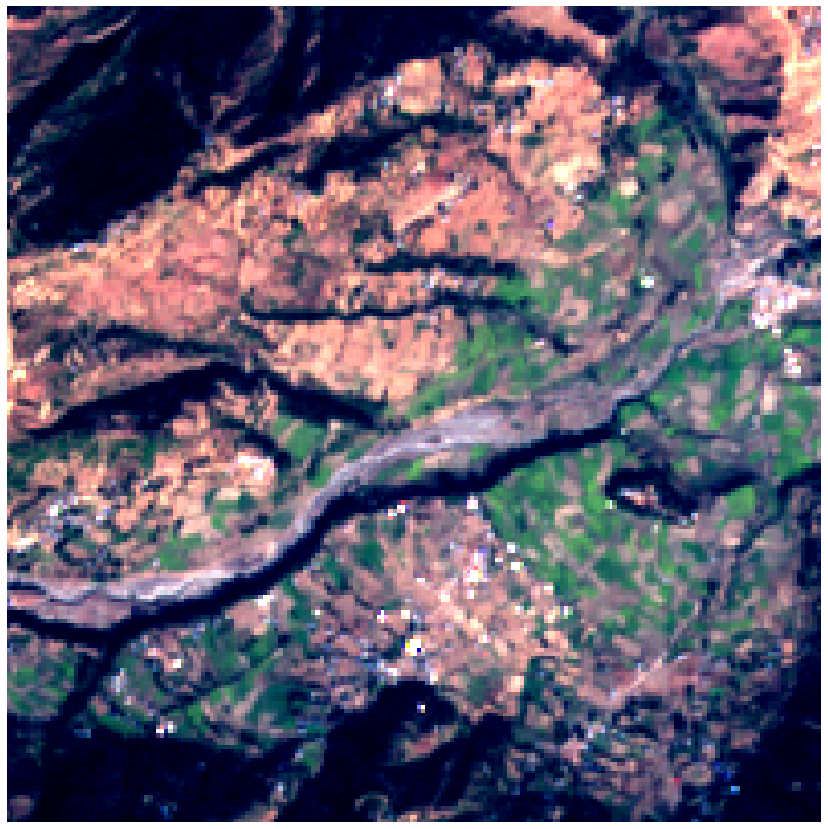

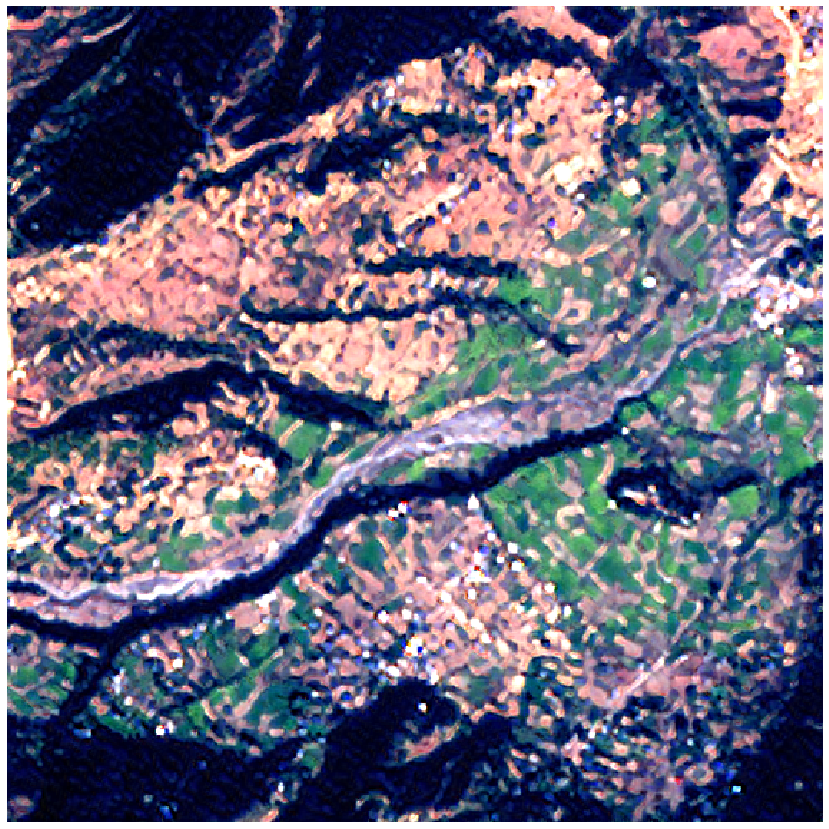

In [102]:
im1 = compare_and_contrast(path,path.parent/'Nepal_SR')

In [47]:
im1.shape

torch.Size([3, 570, 571])

In [91]:
str(p)

'test/NDVI - NRG/other_Dec16_84-31240848_27-57679304_20161222T050222_img_0_NDVI.tif'

In [ ]:
im

error: OpenCV(4.1.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


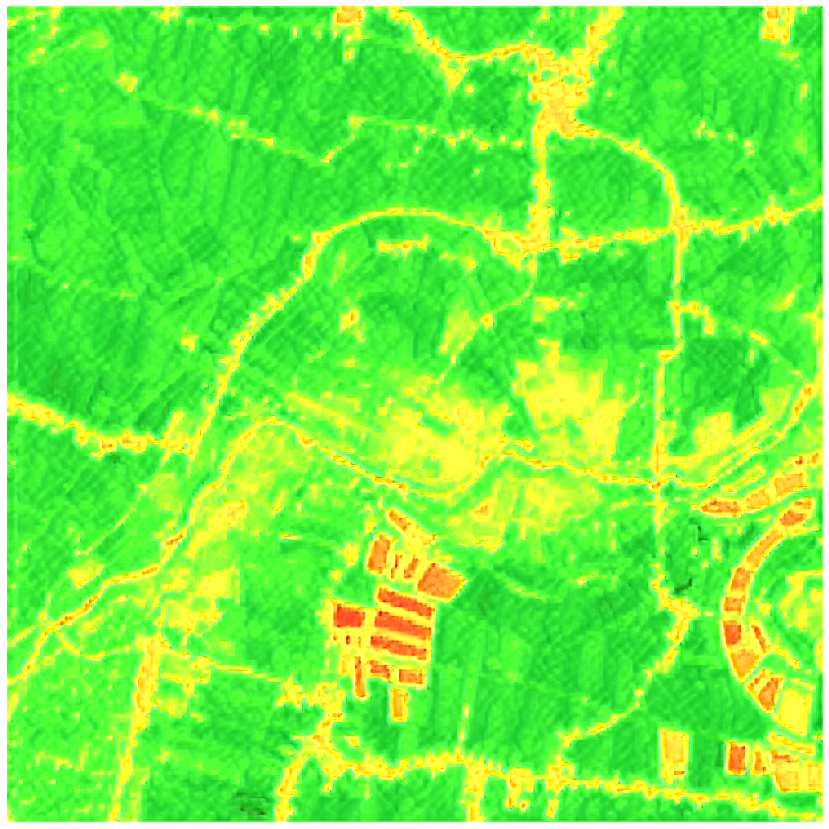

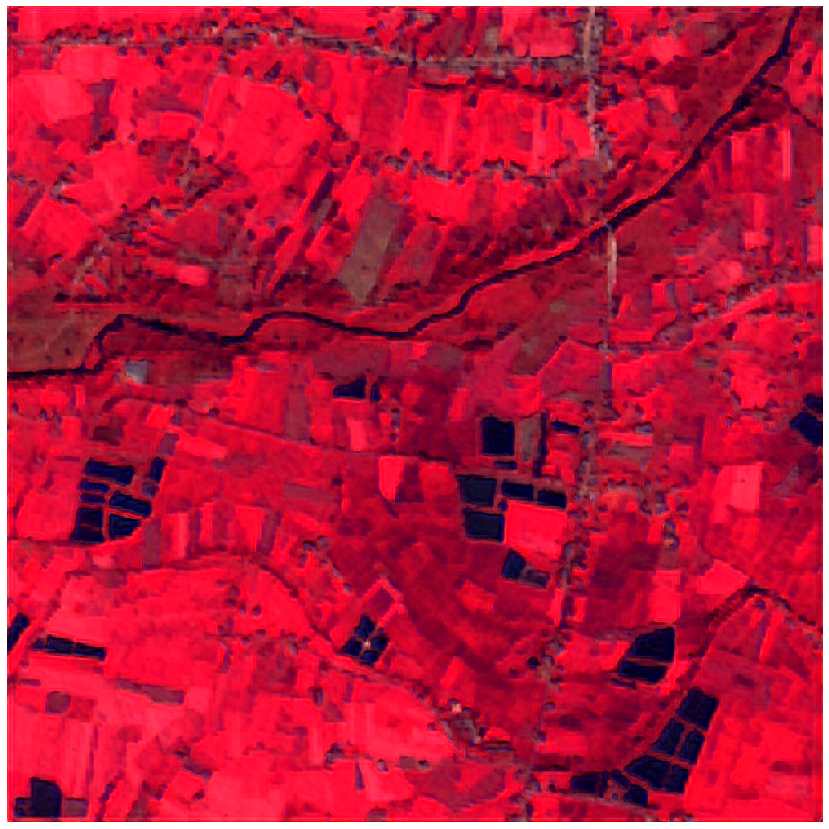

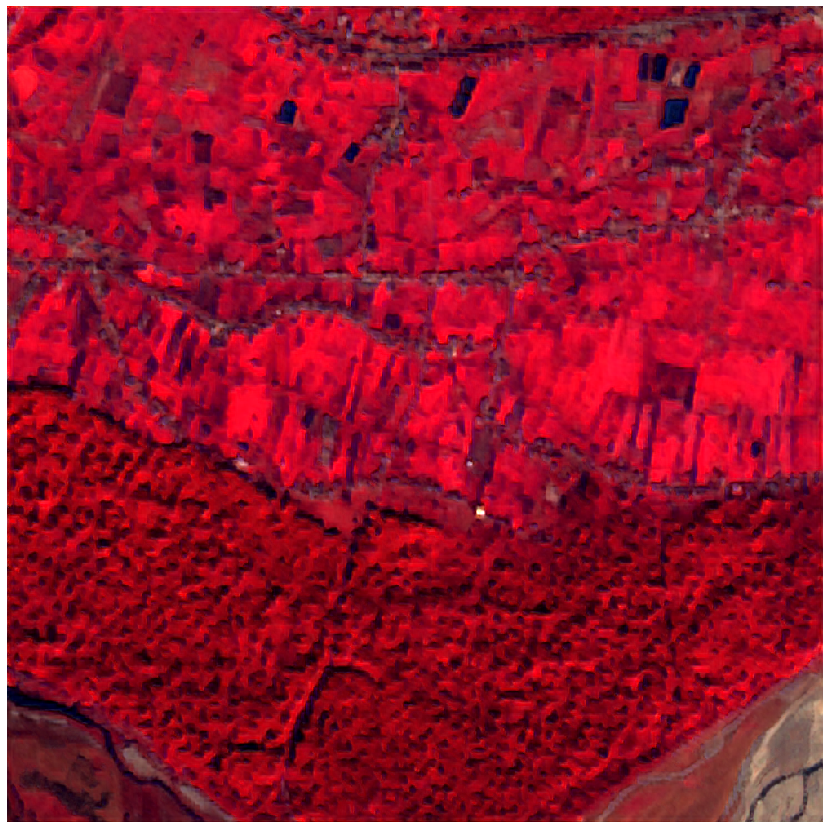

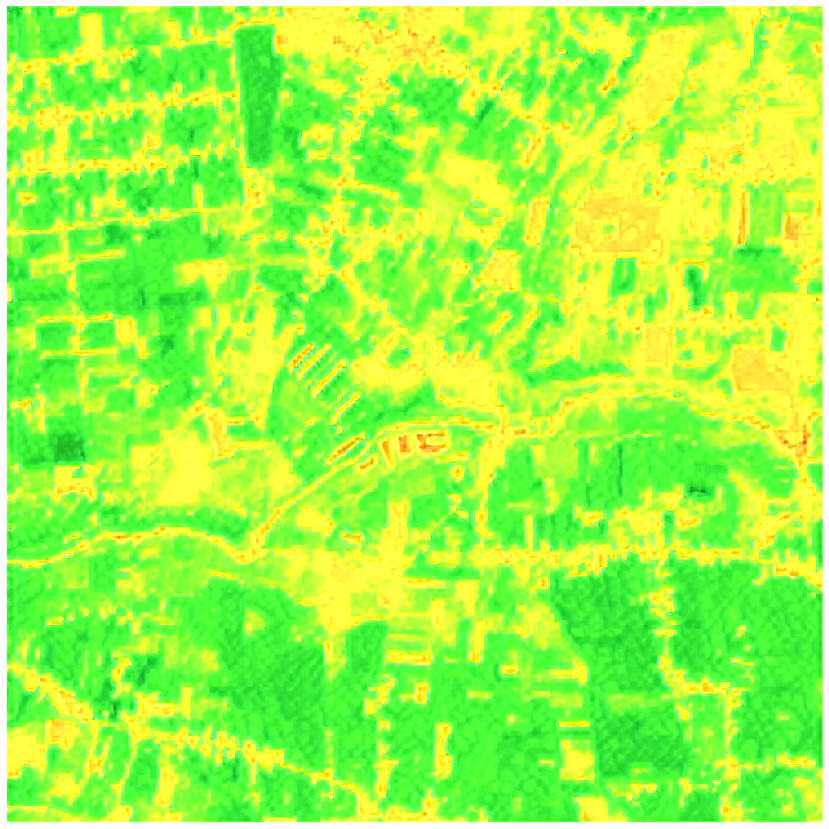

In [97]:
for p in (path_test/'NDVI - NRG').ls():
#     Image(blur_and_sr(p.as_posix())).show(figsize=(15,15))
    
    Image(test_blur_and_sr(p.as_posix(),1000,3).clamp(0,1)).show(figsize=(15,15))

In [53]:
path.ls()[10]

PosixPath('/home/ubuntu/WFP_Nepal_RGB-Scale3.5_PNG/other_Dec16_84-64628207_27-59169432_img_0.png')

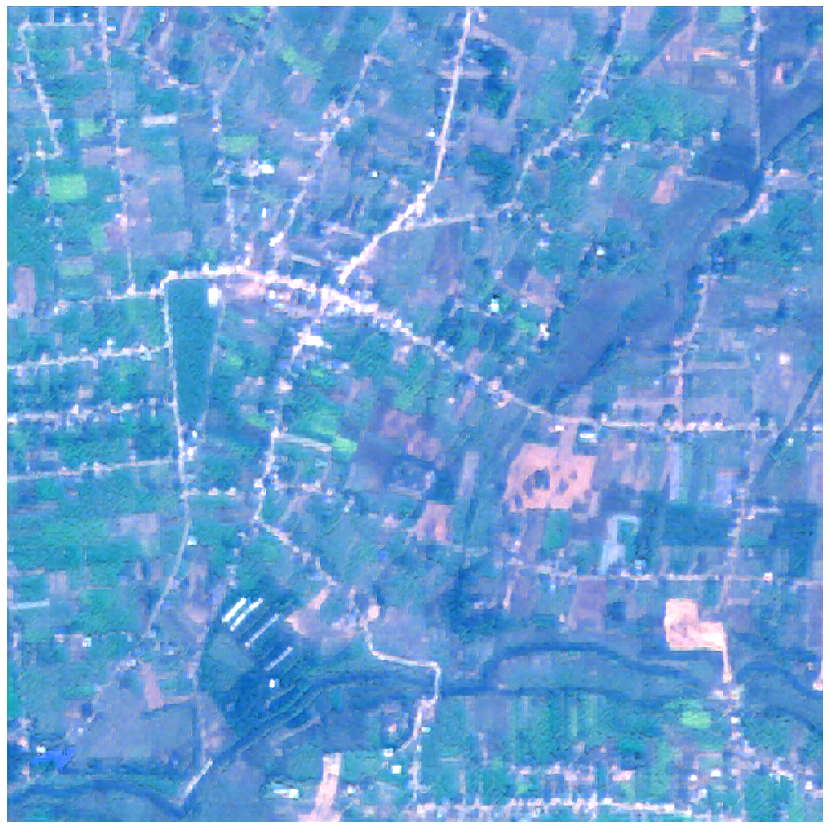

In [85]:
Image(test_blur_and_sr(path.ls()[5].as_posix(),1000,3).clamp(0,1)).show(figsize=(15,15))

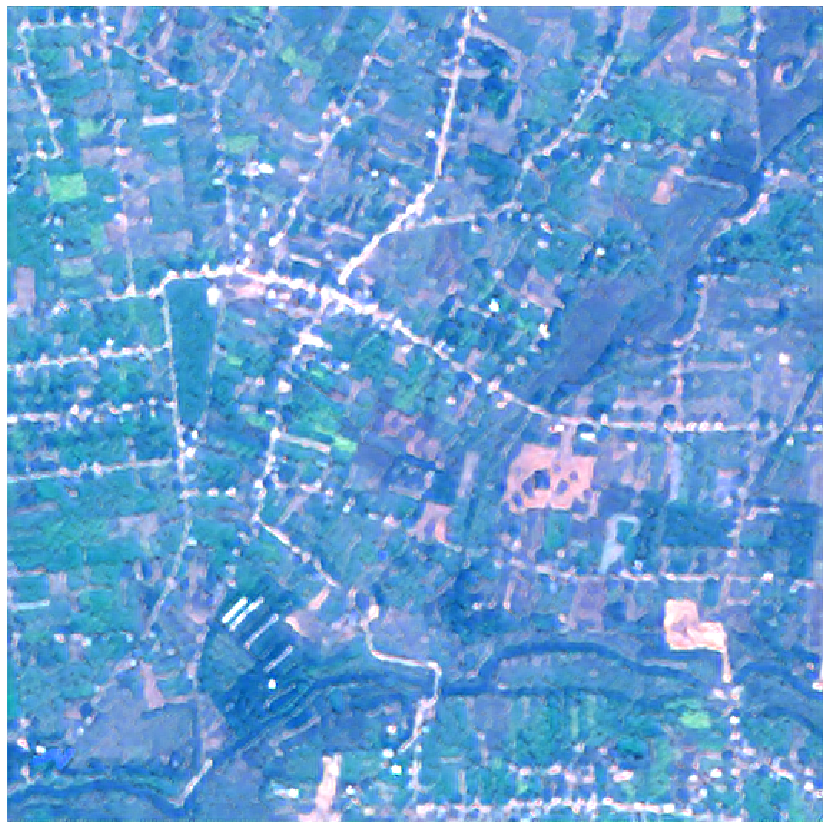

In [70]:
Image(test_blur_and_sr(path.ls()[5].as_posix(),500).clamp(0,1)).show(figsize=(15,15))

In [76]:
def test_blur_and_sr(path,size=500,ks=3):
    img= cv2.cvtColor(cv2.imread(path,-1), cv2.COLOR_BGR2RGB)
    
    #3 seems to work best
    blur = cv2.GaussianBlur(img,(ks,ks),0)
    blur = cv2.resize(blur,(size,size))
    t = Image(tensor(blur/225.).permute(2,0,1).float())
    p,img_hr,b = learn.predict(t)
    return img_hr